<a href="https://colab.research.google.com/github/Kantoros1/Cheese-Game/blob/main/DIZO_002_students.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![Logo 01](https://staff.utia.cas.cz/novozada/dizo/DIZO002_f.png)

[**OUR COURSES**](https://zoi.utia.cas.cz/index.php/teaching/lecture-courses)


# Part 0: Imports Packages & Data & Helper Functions


In [ ]:
import requests
import zipfile
import os
import errno
import cv2 as cv
# For showing the images in Colab use wrap function cv2_imshow
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
import time
import glob
import itertools
import os
from IPython import display
import math
import scipy
import warnings
warnings.filterwarnings("ignore")

filename = 'DIZO002_data.zip'
url = f'http://staff.utia.cas.cz/novozada/dizo/{filename}'
try:
    r = requests.get(url, allow_redirects=True)
    open(filename, 'wb').write(r.content)
    with zipfile.ZipFile(filename, 'r') as zip_ref:
        zip_ref.extractall("")
except OSError as e:
    if e.errno != errno.EEXIST:
        raise
    else:
        print(f'{filename[:-4]} folder already exists!')

def resize(img, height=200, interpolation=cv.INTER_CUBIC):
  scale = height / img.shape[0]
  width = int(img.shape[1] * scale)
  new_size = (width, height)
  return cv.resize(img, new_size, interpolation = interpolation)

def show(img, height=200, interpolation=cv.INTER_CUBIC):
  img_new = resize(img, height, interpolation = interpolation)
  cv2_imshow(img_new)

def show_more(height, *args):
    img_new = cv.hconcat([resize(img, height).astype(float) for img in args])
    cv2_imshow(img_new)

def getFilenames(exts):
    fnames = [glob.glob(ext) for ext in exts]
    fnames = list(itertools.chain.from_iterable(fnames))
    fnames.sort()
    return fnames

# Part 1: Noise

**Noise** in image >> false information of random origin is added to the picture

**How does it arise in digital photography?**
* Directly on the sensor (CCD or CMOS)
* Thermal heating - Dark Current
* Dust particles
* During in-camera processing
* Quantization noise
* Artificial addition

**Types:**
* Additive random noise: g = f + n
* Gaussian white noise (AGWN)
* Impulse noise (Salt & Pepper)


## Salt and Pepper Noise

**Impulse random noise** - the pixels $a_{xy}$ are damaged with probability p, whereby they acquire three values:
* maximum - white (255) - with probability $p/2$
* minimum - black (0) - with probability $p/2$
* $a_{xy}$ - doesn't change - with probability $1 - p$

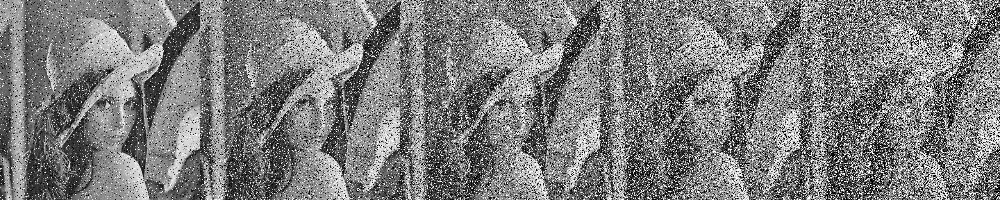

In [ ]:
def sp_noise(img, prob):
  r = np.copy(img)
  m = np.random.rand(img.shape[0], img.shape[1])
  r[m<=prob/2] = 0;
  r[m>=1-prob/2] = 255;
  return r

img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
sp = []
for p in np.arange(0.1,0.6,0.1):
  sp.append(sp_noise(img, p))
show_more(200, *sp)

## Gaussian Noise - Additive White Gaussian Noise (AWGN)

* ***Additive*** because it is added to signal
* ***White*** refers to the idea that it has uniform power across the frequency band for the information system. It is an analogy to the color white which has uniform emissions at all frequencies in the visible spectrum.
* ***Gaussian*** because it has a normal distribution in the time domain with an average time domain value of zero.

Before we program this noise, we first need to think about how the Gaussian noise is measured in the image.

We use **Signal-to-Noise Ratio (SNR)**:
$$
\begin{aligned}
SNR = \frac{P_{signal}}{P_{noise}}
\end{aligned}
$$
where $P$ is average power

An alternative definition of SNR in decibel:
<br />
$$
\begin{aligned}
SNR = 10\log_{10}(\frac{D(f)}{D(n)})\mathrm{[dB]}
\end{aligned}
$$
<br />
* $D(f)$ ... a variance of the (original) signal
* $D(n)$ ... a variance of the noise

In the frequency domain, we can approximate:
* $\frac{|N|^2}{|F|^2}(u, v)$
* For the white nose >> $|N|^2=\sigma_n^2$
* For the uncorrelated signal >> $|F|^2=\sigma_f^2$
* These are our variances:
$$
\begin{aligned}
\frac{\sigma_f^2}{\sigma_n^2}
\end{aligned}
$$

Since we don't know much about the variances in practice, we usually estimate it as a whole

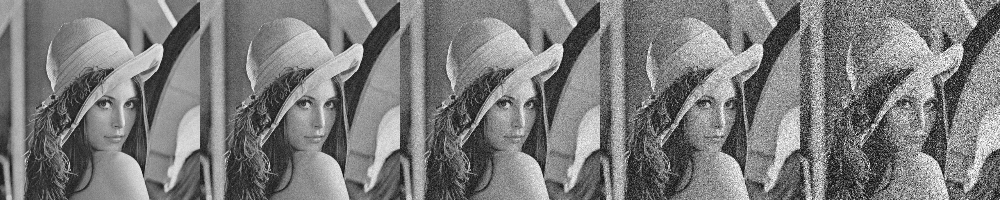

SNR = [20 15 10  5  0]


In [ ]:
def gauss_noise(img, snr):
  m = np.min(img)
  M = np.max(img)
  s = np.sqrt(np.var(img) / np.power(10, snr / 10))
  r = img + s * np.random.randn(img.shape[0], img.shape[1])
  r[r<m] = m
  r[r>M] = M
  return r

img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
gauss = []
snrs = np.arange(20,-5,-5)
# snrs = np.arange(100,-5,-25)
for snr in snrs:
  gauss.append(gauss_noise(img, snr))
show_more(200, *gauss)
print(f'SNR = {snrs}')

## Noise reduction

### Averaging over time

If we have a fixed scene, or we are able to register multiple images of the same scene, we can use the time averaging technique.

This technique is great - it doesn't introduce any additional artifacts into the signal.

Noise decreases with value $\sigma^2/N$, where $N$ is number of frames, and $\sigma^2$ is a variation of the noise.

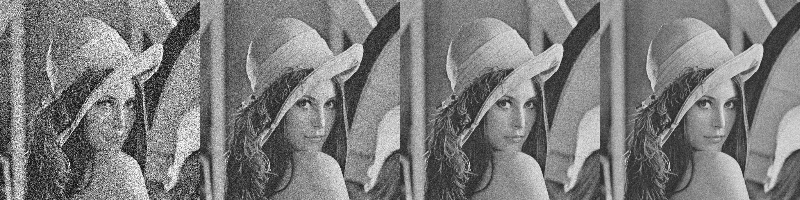

Number of repetition: [1, 5, 10, 20]


In [ ]:
def denoise_averaging(img, snr, repet):
  r = np.zeros_like(img).astype(float)
  for _ in range(repet):
    r += gauss_noise(img, snr)
  return r / repet

img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
aver = []
snr = 0
repets = [1, 5, 10, 20]
for rep in repets:
  aver.append(denoise_averaging(img, snr, rep))
show_more(200, *aver)
print(f'Number of repetition: {repets}')

### Blurring

**Using a 2D-Convolution Kernel**

Local averaging with mask (convolution)


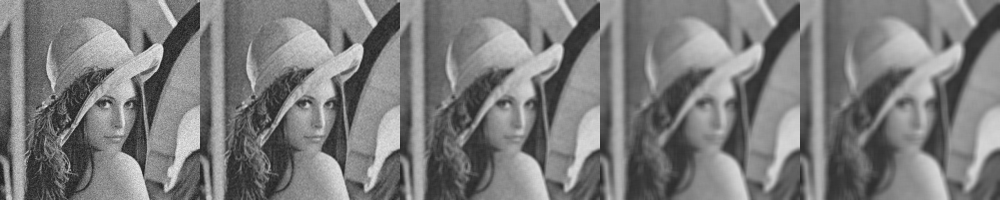

SNR = 5 
size of masks = [3, 5, 9, 15, 17]


In [ ]:
def blurring(img, mask):
  r = cv.filter2D(img, ddepth=-1, kernel=mask)
  return r

img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
snr = 5
img = gauss_noise(img, snr)
blur = []
sizes = [3, 5, 9, 15, 17]
for size in sizes:
  mask = np.ones((size, size)) / np.power(size,2)
  blur.append(blurring(img, mask))
show_more(200, *blur)
print(f'SNR = {snr} \nsize of masks = {sizes}')

**Using OpenCV’s Built-In Function**

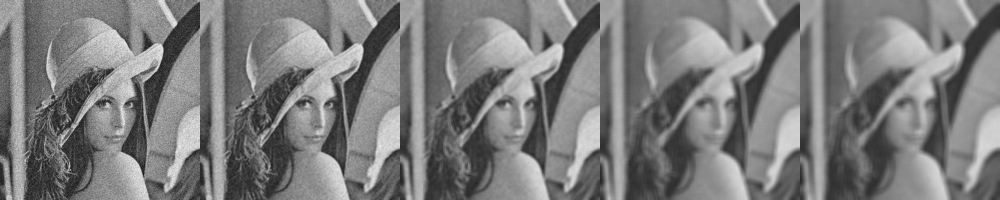

SNR = 5 
size of masks = [3, 5, 9, 15, 17]


In [ ]:
img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
snr = 5
img = gauss_noise(img, snr)
blur_cv = []
sizes = [3, 5, 9, 15, 17]
for size in sizes:
  blur_cv.append(cv.blur(img, ksize=(size, size)))
show_more(200, *blur_cv)
print(f'SNR = {snr} \nsize of masks = {sizes}')

**Applying Gaussian Blurring in OpenCV**

The Gaussian blur weights pixel values, based on their distance from the center of the kernel.

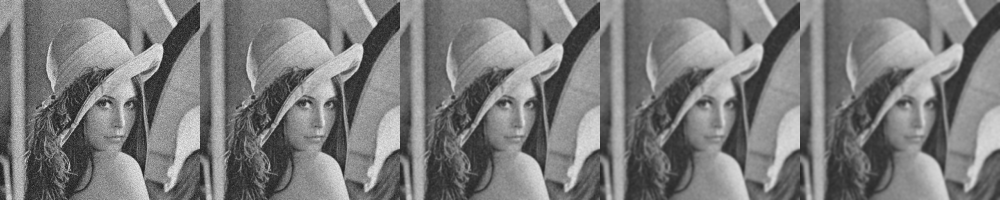

SNR = 5 
size of masks = [3, 5, 9, 15, 17]


In [ ]:
img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
snr = 5
img = gauss_noise(img, snr)
blur_gauss = []
sizes = [3, 5, 9, 15, 17]
for size in sizes:
  blur_gauss.append(cv.GaussianBlur(img, ksize=(size, size), sigmaX=0, sigmaY=0))
show_more(200, *blur_gauss)
print(f'SNR = {snr} \nsize of masks = {sizes}')

### Non-linear Filtering

**Median Blurring to an Image in OpenCV**

In median blurring, each pixel in the source image is replaced by the median value of the image pixels in the kernel area.

But first recall - what is the median of the data?

In [ ]:
np.random.seed(1234)
size_array = 9
m = np.random.random_integers(0, 10, size_array)
print(f'array = {m}')
med = np.median(m)
m = np.sort(m)
print(f'sorted = {m}')
if np.mod(size_array, 2):
  print(f'median by hand 1 = {m[size_array//2]}')
else:
  print(f'median by hand = {(m[size_array//2 - 1] + m[size_array//2]) / 2 }')
print(f'median by NumPy= {med}')

array = [3 6 5 4 8 9 1 7 9]
sorted = [1 3 4 5 6 7 8 9 9]
median by hand 1 = 6
median by NumPy= 6.0


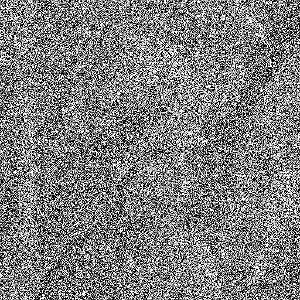

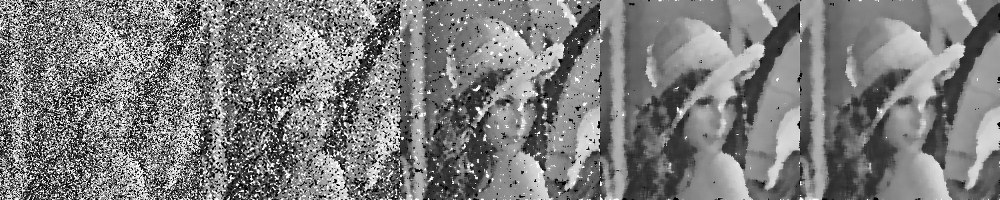

SNR = 5 
size of masks = [3, 5, 9, 15, 17]


In [ ]:
img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
snr = 5
# img = gauss_noise(img, snr)
img = sp_noise(img, 0.8)
show(img, 300)
blur_median = []
sizes = [3, 5, 9, 15, 17]
for size in sizes:
  blur_median.append(cv.medianBlur(src=img.astype(np.uint8), ksize=size))
show_more(300, *blur_median)
print(f'SNR = {snr} \nsize of masks = {sizes}')

**Bilateral Filtering to an Image in OpenCV**

denoising by blurring ➡ loss of edges
In such cases, try to use bilateral filtering
* The filter is applied selectively to blur similar intensity pixels in a neighborhood.
* Sharp edges are preserved, wherever possible.
* We can control the spatial size and the degree to which the neighboring pixels are included.

Bilateral filtering essentially applies a 2D Gaussian (weighted) blur to the image, while the shape of the kernel actually depends on the local image content, at every pixel location.

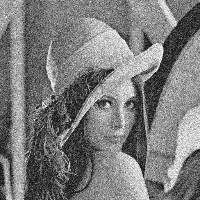

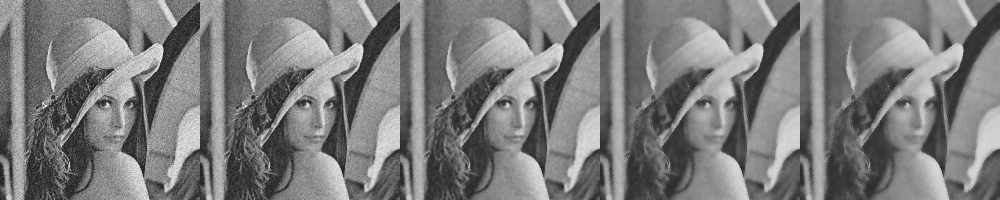

SNR = 5 
sizes = [3, 5, 9, 15, 17]


In [ ]:
img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
snr = 5
img = gauss_noise(img, snr)
show(img)
blur_bilateral = []
sizes = [3, 5, 9, 15, 17]
for size in sizes:
  blur_bilateral.append(cv.bilateralFilter(src=img.astype(np.uint8), d=size, sigmaColor=75, sigmaSpace=75))
show_more(200, *blur_bilateral)
print(f'SNR = {snr} \nsizes = {sizes}')

**Non-local means**

We use the fact that there is a lot of redundancy in a image. Here are some examples in our image - similar areas in the image are marked by squares of the same color:

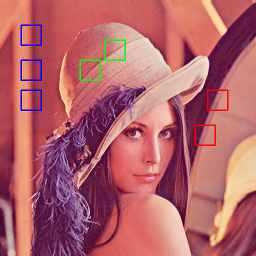

In [ ]:
img = cv.imread('lena.png')
nlm = np.copy(img)

d = 40
thickness = 2
color = (255, 0, 0)
r, c = 42, 50
nlm = cv.rectangle(nlm, (r, c), (r+d, c+d), color, thickness)
r, c = 42, 120
nlm = cv.rectangle(nlm, (r, c), (r+d, c+d), color, thickness)
r, c = 42, 180
nlm = cv.rectangle(nlm, (r, c), (r+d, c+d), color, thickness)

color = (0, 255, 0)
r, c = 210, 80
nlm = cv.rectangle(nlm, (r, c), (r+d, c+d), color, thickness)
r, c = 160, 120
nlm = cv.rectangle(nlm, (r, c), (r+d, c+d), color, thickness)

color = (0, 0, 255)
r, c = 390, 250
nlm = cv.rectangle(nlm, (r, c), (r+d, c+d), color, thickness)
r, c = 415, 180
nlm = cv.rectangle(nlm, (r, c), (r+d, c+d), color, thickness)

show(nlm, 256)

$$
\begin{aligned}
I(p) = \frac{1}{Z}\sum_{q\in\cal{N}}w_{pq}I(q)
\end{aligned}
$$
<br />
* $Z = \sum w_{pq}$ ... normalization factor
* $\cal{N}$ ... a neighborhood around the pixel $p$

The weights $w_{pq}$ are computed as:

$$
\begin{aligned}
w_{pq} = exp(-\frac{\lVert \Omega(I(p))-\Omega(I(q)) \rVert^2}{h^2})
\end{aligned}
$$
<br />

* $\Omega(p)$ indicates a window centered on pixel $p$.

This equations in pseudo-code:

```
for x,y in Image:
    total_color = 0
    Z = 0    
    for xp,yp in big_neighborhood(x,y):
        difference = norm(small_neighborhood(x,y) - small_neighborhood(xp,yp))
        w = exp(-difference/h^2)
        total_color = total_color + w*I(xp, yp)        
    I(x,y) = color / Z
```

To save time, we will use the OpenCV function: ```cv2.fastNlMeansDenoising()```

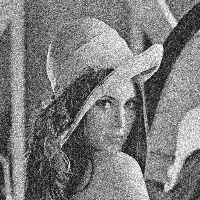

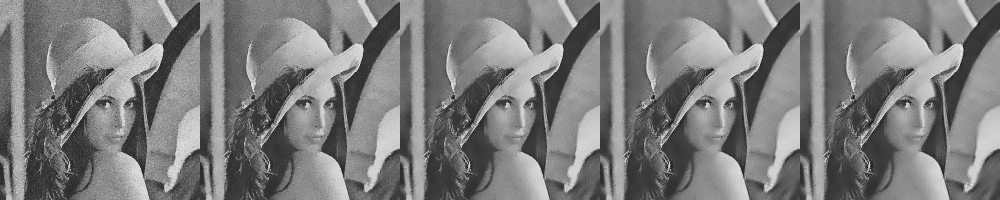

SNR = 3 
sizes = [3, 5, 9, 15, 17]


In [ ]:
img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
snr = 3
img = gauss_noise(img, snr)
show(img)
blur_nlmeans = []
sizes = [3, 5, 9, 15, 17]
for size in sizes:
  blur_nlmeans.append(cv.fastNlMeansDenoising(img.astype(np.uint8), h=25, templateWindowSize=size, searchWindowSize=20))
show_more(200, *blur_nlmeans)
print(f'SNR = {snr} \nsizes = {sizes}')

**Comparison of the method - AWGN**

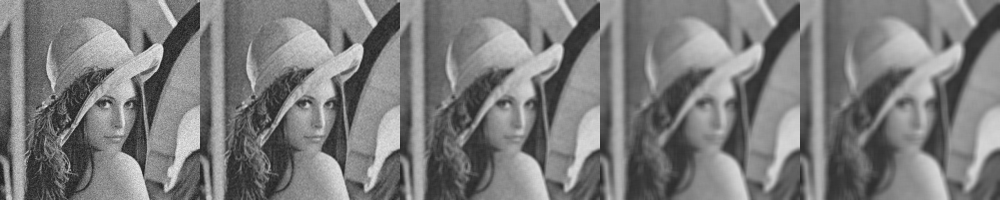

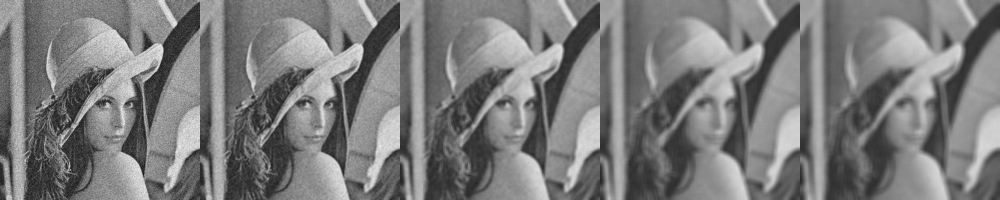

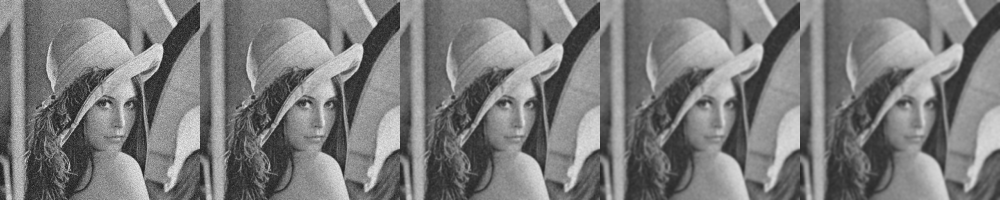

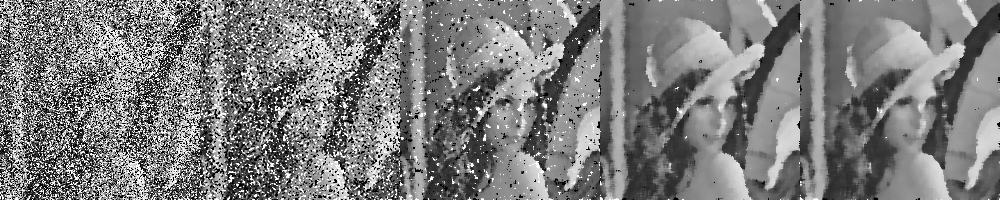

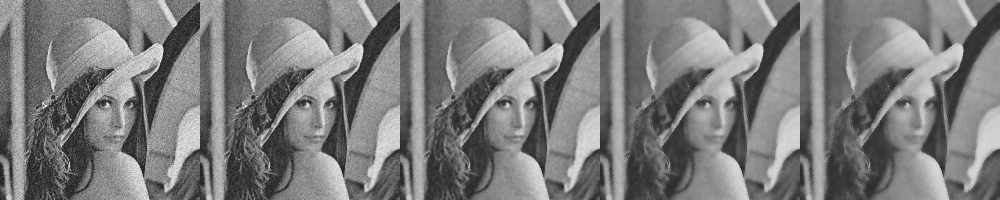

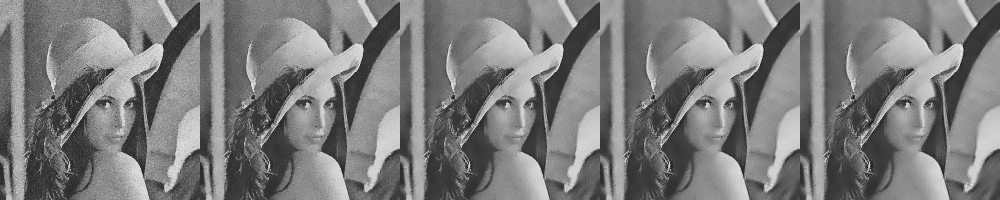

In [ ]:
show_more(200, *blur)
show_more(200, *blur_cv)
show_more(200, *blur_gauss)
show_more(200, *blur_median)
show_more(200, *blur_bilateral)
show_more(200, *blur_nlmeans)

To suppress gaussian noise, I would recommend using Nl-means de-noising with parameter testing.

**Comparison of the method - Salt & Peper**

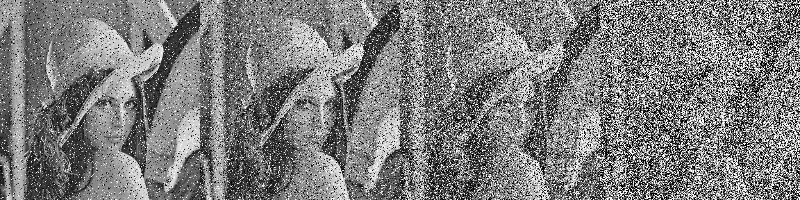

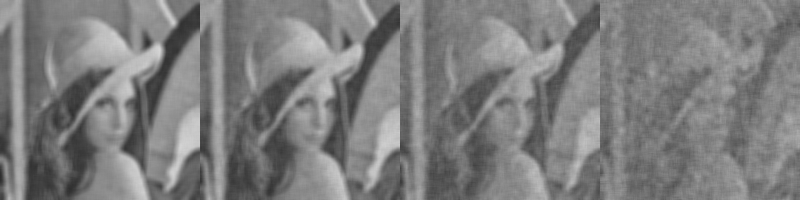

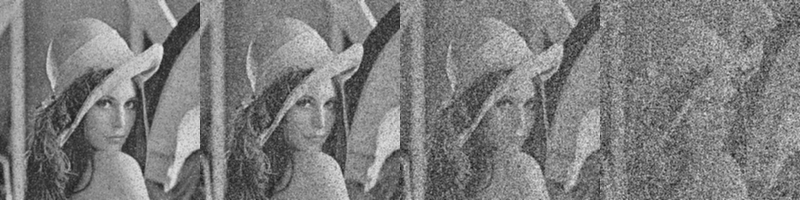

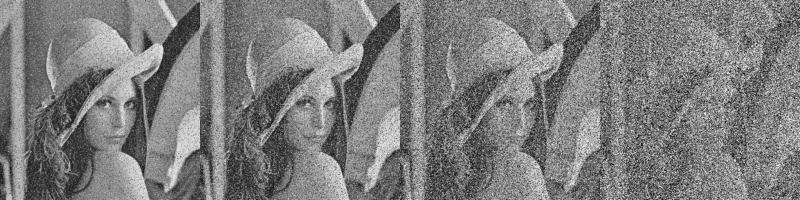

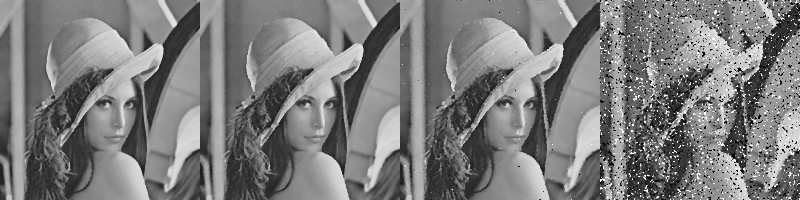

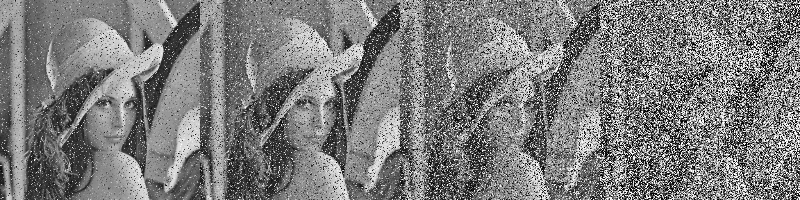

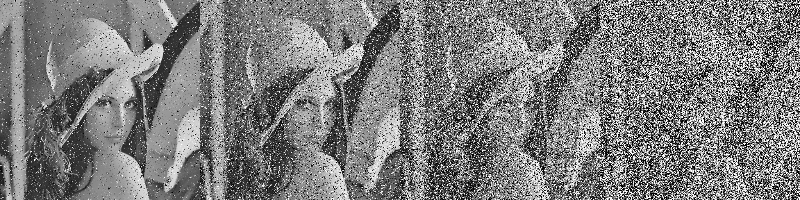

size = 5 
probability = [0.1, 0.2, 0.4, 0.7]


In [ ]:
img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
snr = 5
orig = []
blur_sp = []
blur_cv_sp = []
blur_gauss_sp = []
blur_median_sp = []
blur_bilateral_sp = []
blur_nlmeans_sp = []
probs = [0.1, 0.2, 0.4, 0.7]
size = 5
for p in probs:
  temp = sp_noise(img, p)
  orig.append(temp)
  blur_sp.append(blurring(temp, mask))
  blur_cv_sp.append(cv.blur(temp, ksize=(size, size)))
  blur_gauss_sp.append(cv.GaussianBlur(temp, ksize=(size, size), sigmaX=0, sigmaY=0))
  blur_median_sp.append(cv.medianBlur(temp.astype(np.uint8), ksize=size))
  blur_bilateral_sp.append(cv.bilateralFilter(temp.astype(np.uint8),
                                              d=size,
                                              sigmaColor=75,
                                              sigmaSpace=75))
  blur_nlmeans_sp.append(cv.fastNlMeansDenoising(temp.astype(np.uint8),
                                                 h=25,
                                                 templateWindowSize=size,
                                                 searchWindowSize=20))
show_more(200, *orig)
show_more(200, *blur_sp)
show_more(200, *blur_cv_sp)
show_more(200, *blur_gauss_sp)
show_more(200, *blur_median_sp)
show_more(200, *blur_bilateral_sp)
show_more(200, *blur_nlmeans_sp)
print(f'size = {size} \nprobability = {probs}')

If you meet S&P-type noise in the image, be sure to use the median!

# Part 2: Edge Detection

How to detect edges in images?

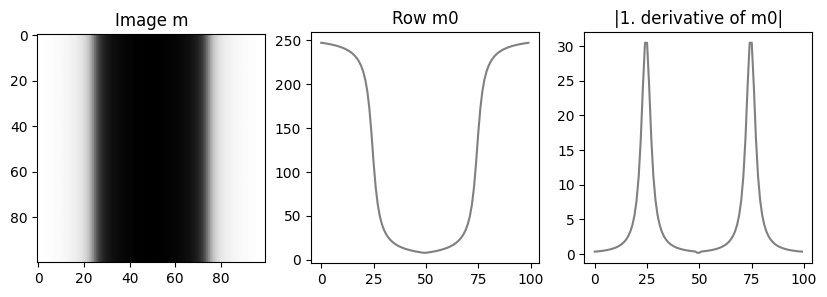

In [ ]:
x = np.linspace(-10, 10)
y = np.arctan(np.hstack((x[::-1], x)))
m = ((np.tile(y, (x.shape[0] * 2, 1)) + np.pi/2) / np.pi) * 255
m0 = np.asarray(m[0,:])

plt.figure(figsize=(10, 3))
plt.subplot(131)
plt.imshow(m, "gray")
plt.title("Image m")
plt.subplot(132)
plt.plot(m0, "gray")
plt.title("Row m0")
plt.subplot(133)
plt.plot(np.abs(np.gradient(m0)), "gray")
plt.title("|1. derivative of m0|");

## Based on 1. derivation

### Roberts

Lawrence Roberts proposed it in 1963, and it was one of the first edge detectors. The Roberts operator measures a 2-D spatial gradient on an image. The input and output are both grayscale images.

The operator is made up of a pair of 2×2 convolution masks:
$$
\begin{aligned}
M_{1} =
\begin{pmatrix}
0 & 1\\
-1 & 0
\end{pmatrix}, \;
M_{2} =
\begin{pmatrix}
1 & 0\\
0 & -1
\end{pmatrix}
\end{aligned}
$$

The masks can be applied to the input image independently to produce separate gradient component measurements in each orientation:
$$
\begin{aligned}
G_1 = \mathrm{Img} * M_1, \;G_2 = \mathrm{Img} * M_2
\end{aligned}
$$
The gradient magnitude is given by:
$$
\begin{aligned}
G = \sqrt{G_1^2 + G_2^2}
\end{aligned}
$$

At the end, we use the threshold on the $G$



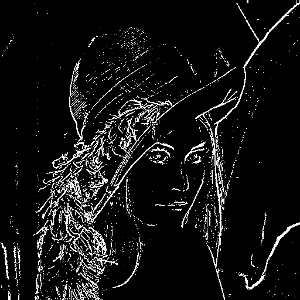

In [ ]:
def roberts(img, thresh):
  temp = img.astype(np.float32)
  m1 = np.array( [[ 0, 1 ], [ -1, 0 ]] )
  g1 = cv.filter2D(img, ddepth=-1, kernel=m1)
  g2 = cv.filter2D(img, ddepth=-1, kernel=np.rot90(m1))
  edges = np.hypot( g1, g2) >= thresh
  return edges.astype(np.uint8) * 255

img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
img_rob = roberts(img, 20)
show(img_rob, 300)

It incorrectly detects diagonal edges - our improvements:

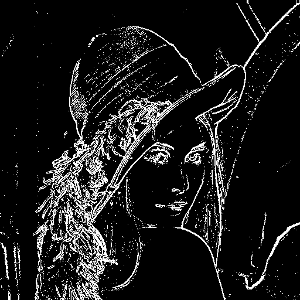

In [ ]:
def roberts_our(img, thresh):
  temp = img.astype(np.float32)
  m1 = np.array( [[ 0, 1 ], [ -1, 0 ]] )
  m2 = np.array( [-1, 1 ] )
  g1 = cv.filter2D(img, ddepth=-1, kernel=m1)
  g2 = cv.filter2D(img, ddepth=-1, kernel=np.rot90(m1))
  g3 = cv.filter2D(img, ddepth=-1, kernel=m2)
  g4 = cv.filter2D(img, ddepth=-1, kernel=np.transpose(m2))
  edges1 = np.hypot( g1, g2) >= thresh
  edges2 = np.hypot( g3, g4) >= thresh
  return (edges1 | edges2).astype(np.uint8) * 255


img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
img_rob = roberts_our(img, 20)
show(img_rob, 300)

### Sobel

It is named after Irwin Sobel and Gary Feldman - they presented the idea in 1968.

The Sobel operator works similarly to the Roberts operator. It also has a pair of 3×3 convolution masks (vertical and horizontal):
$$
\begin{aligned}
M_{x} =
\begin{pmatrix}
-1 & 0 & 1\\
-2 & 0 & 2\\
-1 & 0 & 1
\end{pmatrix}, \;
M_{y} =
\begin{pmatrix}
1 & 2 & 1\\
0 & 0 & 0\\
-1 & -2 & -1
\end{pmatrix}
\end{aligned}
$$
<br />
$$
\begin{aligned}
G_x = \mathrm{Img} * M_1, \;G_y = \mathrm{Img} * M_2
\end{aligned}
$$
<br />
$$
\begin{aligned}
G = \sqrt{G_x^2 + G_y^2}
\end{aligned}
$$

At the end, we use the threshold on the $G$



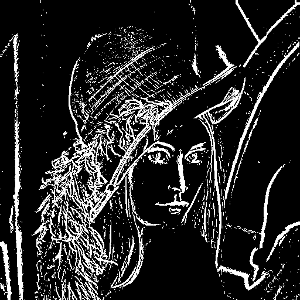

In [ ]:
def sobel_official(img, thresh):
  temp = img.astype(np.float32)
  mx = np.array( [[ -1, 0, 1 ], [ -2, 0, 2], [ -1, 0, 1]] )
  gx = cv.filter2D(img, ddepth=-1, kernel=mx)
  gy = cv.filter2D(img, ddepth=-1, kernel=np.rot90(mx))
  edges = np.hypot( gx, gy) >= thresh
  return edges.astype(np.uint8) * 255

img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
img_sob = sobel_official(img, 50)
show(img_sob, 300)

Same problem with the diagonal edges - our improvements:

[[-1  0  1]
 [-2  0  2]
 [-1  0  1]]
[[-2 -1  0]
 [-1  0  1]
 [ 0  1  2]]


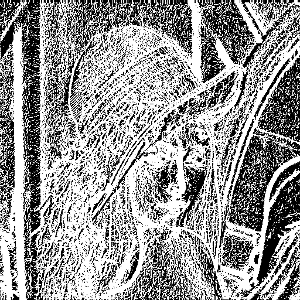

In [ ]:
def sobel_our(img, thresh):
  temp = img.astype(np.float32)
  m1 = np.array( [[ -1, 0, 1 ], [ -2, 0, 2], [ -1, 0, 1]] )
  print(m1)
  m2 = np.array( [[ -2, -1, 0 ], [ -1, 0, 1], [ 0, 1, 2]] )
  print(m2)
  gx = cv.filter2D(img, ddepth=-1, kernel=m1)
  gy = cv.filter2D(img, ddepth=-1, kernel=np.transpose(m1))
  gd1 = cv.filter2D(img, ddepth=-1, kernel=m2)
  gd2 = cv.filter2D(img, ddepth=-1, kernel=np.rot90(m2))
  edges1 = np.hypot( gx, gy) >= thresh
  edges2 = np.hypot( gd1, gd2) >= thresh
  return (edges1 | edges2).astype(np.uint8) * 255

img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
img_sob = sobel_our(img, 10)
show(img_sob, 300)

### Prewitt

Same as Sobel, but with these masks:
$$
\begin{aligned}
M_{x} =
\begin{pmatrix}
-1 & 0 & 1\\
-1 & 0 & 1\\
-1 & 0 & 1
\end{pmatrix}, \;
M_{y} =
\begin{pmatrix}
1 & 1 & 1\\
0 & 0 & 0\\
-1 & -1 & -1
\end{pmatrix}
\end{aligned}
$$

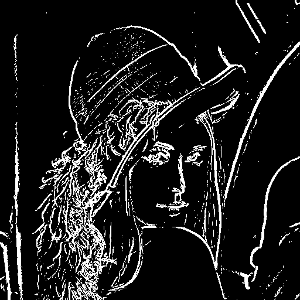

In [ ]:
def prewitt(img, thresh):
  temp = img.astype(np.float32)
  m1 = np.array( [[ -1, 0, 1 ], [ -1, 0, 1], [ -1, 0, 1]] )
  m2 = np.array( [[ -1, -1, 0 ], [ -1, 0, 1], [ 0, 1, 1]] )
  gx = cv.filter2D(img, ddepth=-1, kernel=m1)
  gy = cv.filter2D(img, ddepth=-1, kernel=np.transpose(m1))
  gd1 = cv.filter2D(img, ddepth=-1, kernel=m2)
  gd2 = cv.filter2D(img, ddepth=-1, kernel=np.rot90(m2))
  edges1 = np.hypot( gx, gy) >= thresh
  edges2 = np.hypot( gd1, gd2) >= thresh
  return (edges1 | edges2).astype(np.uint8) * 255

img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
img_prewitt = prewitt(img, 50)
show(img_prewitt, 300)

### Kirsch

Again, it's just a matter of changing the masks:
$$
\begin{aligned}
M_{n} =
\begin{pmatrix}
5 & 5 & 5\\
-3 & 0 & -3\\
-3 & -3 & -3
\end{pmatrix},
\end{aligned}
$$
<br />
where $n=\{ 1,2,..,8 \} $ ~ 45-degree rotation of single kernel through 8 directions.

$$
\begin{aligned}
G_{\mathrm{final}} =
\max_{n}\;\mathrm{Img} * M_n
\end{aligned}
$$
<br />
Then we will use threshold applied on this mask to get the final output.

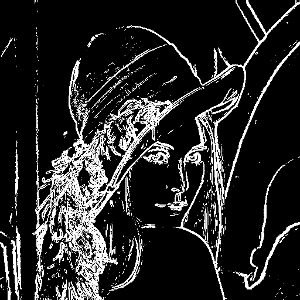

In [ ]:
def kirsch(img, thresh):
  temp = img.astype(np.float32)
  masks = []
  masks.append( np.array( [[ 5, 5, 5 ], [ -3, 0, -3], [ -3, -3, -3]] ) )
  masks.append( np.array( [[ 5, 5, -3 ], [ 5, 0, -3], [ -3, -3, -3]] ) )
  masks.append( np.transpose(masks[0]) )
  masks.append( masks[1][::-1,:] )
  masks.append( masks[0][::-1,:] )
  masks.append( masks[1][::-1,::-1] )
  masks.append( masks[2][:,::-1] )
  masks.append( masks[1][:,::-1] )

  temp = np.zeros_like(img)
  for mask in masks:
    gn = cv.filter2D(img, ddepth=-1, kernel=mask)
    temp = np.maximum(temp, gn)
  edges = temp >= thresh
  return edges.astype(np.uint8) * 255

img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
img_kirsch = kirsch(img, 250)
show(img_kirsch, 300)

### Canny

The Canny edge detector uses a multi-stage algorithm to detect a wide range of edges in images. It was developed by John F. Canny in 1986.

**The Canny edge detection algorithm is composed of 5 steps:**

0.  Convert the image to grayscale if it is colored
1.  Noise reduction
2.  Gradient calculation
3.  Non-maximum suppression
4.  Double threshold
5.  Edge Tracking by Hysteresis

**0. Convert the image:**


In [ ]:
img = cv.imread('lena.png')
img_0 = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

**1. Noise Reduction**

Edge detection results are highly sensitive to image noise >> applying Gaussian blur to smooth it

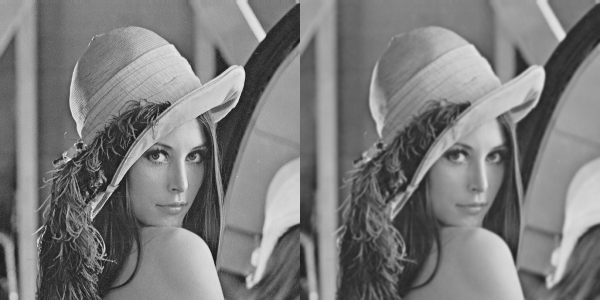

In [ ]:
img_1 = cv.GaussianBlur(img_0, ksize=(0, 0), sigmaX=1.4, sigmaY=1.4)
show_more(300, img_0, img_1)

**2. Gradient Calculation**

To calculate the edge intensity and direction (horizontal and vertical) we use two Sobel kernels:

$$
\begin{aligned}
K_{x} =
\begin{pmatrix}
-1 & 0 & 1\\
-2 & 0 & 2\\
-1 & 0 & 1
\end{pmatrix},\;
K_{y} =
\begin{pmatrix}
1 & 2 & 1\\
0 & 0 & 0\\
-1 & -2 & -1
\end{pmatrix}
\end{aligned}
$$
<br />
The magnitude $G$ and the slope $\theta$ of the gradient are calculated as follow:
$$
\begin{aligned}
|G| = \sqrt{I_x^2+I_y^2}
\end{aligned}
$$
$$
\begin{aligned}
\theta(x,y) = arctan(\frac{I_y}{I_x})
\end{aligned}
$$

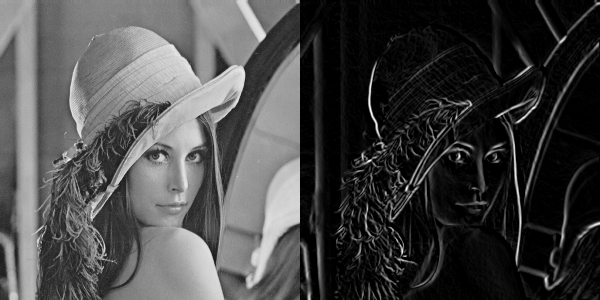

In [ ]:
def canny_sobel_filters(img):
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)

    Ix = cv.filter2D(img, ddepth=-1, kernel=Kx)
    Iy = cv.filter2D(img, ddepth=-1, kernel=Ky)

    G = np.hypot(Ix, Iy)
    G = G / G.max() * 255
    theta = np.arctan2(Iy, Ix)

    return G, theta

img_2_G, img_2_theta = canny_sobel_filters(img_1)
show_more(300, img_0, img_2_G.astype(np.uint8))

**3. Non-maximum suppression**

To thin out the edges:
* The algorithm goes through all the points on the gradient intensity matrix and finds the pixels with the maximum value in the edge directions.

The steps of algorithm are:
* Create a matrix initialized to 0 of the same size of the original gradient intensity matrix;
* Identify the edge direction based on the angle value from the angle matrix;
* Check if the pixel in the same direction has a higher intensity than the pixel that is currently processed;
* Return the image processed with the non-max suppression algorithm.

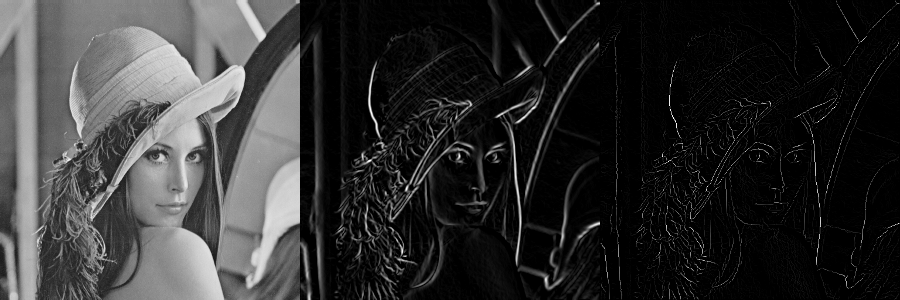

In [ ]:
def canny_non_max_suppression(img, D):
  M, N = img.shape
  Z = np.zeros((M,N), dtype=np.int32)
  angle = D * 180. / np.pi
  angle[angle < 0] += 180
  for i in range(1,M-1):
    for j in range(1,N-1):
      try:
        q = 255
        r = 255
        #angle 0
        if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
          q = img[i, j+1]
          r = img[i, j-1]
        #angle 45
        elif (22.5 <= angle[i,j] < 67.5):
          q = img[i+1, j-1]
          r = img[i-1, j+1]
        #angle 90
        elif (67.5 <= angle[i,j] < 112.5):
          q = img[i+1, j]
          r = img[i-1, j]
        #angle 135
        elif (112.5 <= angle[i,j] < 157.5):
          q = img[i-1, j-1]
          r = img[i+1, j+1]

        if (img[i,j] >= q) and (img[i,j] >= r):
          Z[i,j] = img[i,j]
        else:
          Z[i,j] = 0
      except IndexError as e:
        pass
  return Z

img_3 = canny_non_max_suppression(img_2_G, img_2_theta)
show_more(300, img_0, img_2_G.astype(np.uint8), img_3.astype(np.uint8))

**4. Double threshold**
We identify 3 kinds of pixels:

1.   **Strong** pixels are pixels that have an intensity so high that we are sure they contribute to the final edge.
2.   **Weak** pixels are pixels that have an intensity value that is not enough to be considered as strong ones, but yet not small enough to be considered as non-relevant for the edge detection.
3.   Other pixels are considered as **non-relevant** for the edge.

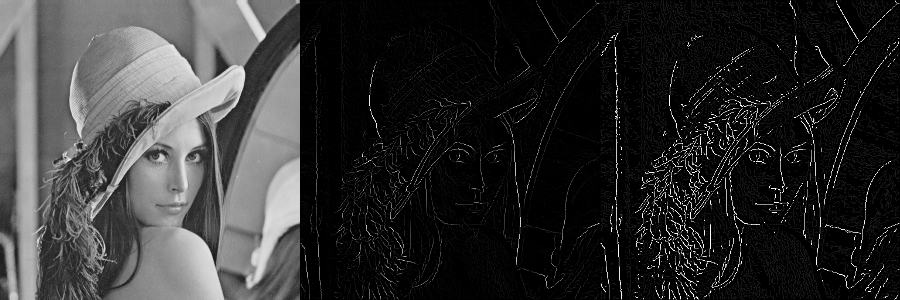

In [ ]:
def canny_threshold(img, lowThresholdRatio=0.05, highThresholdRatio=0.12):
  highThreshold = img.max() * highThresholdRatio;
  lowThreshold = highThreshold * lowThresholdRatio;
  M, N = img.shape
  res = np.zeros((M,N), dtype=np.int32)
  weak = np.int32(25)
  strong = np.int32(255)
  strong_i, strong_j = np.where(img >= highThreshold)
  zeros_i, zeros_j = np.where(img < lowThreshold)
  weak_i, weak_j = np.where((img <= highThreshold) & (img >= lowThreshold))
  res[strong_i, strong_j] = strong
  res[weak_i, weak_j] = weak
  return res, weak, strong

img_4_res, img_4_weak, img_4_strong = canny_threshold(img_3)
show_more(300, img_0, img_3.astype(np.uint8), img_4_res.astype(np.uint8))

**5. Edge Tracking by Hysteresis**

Based on the threshold results, the hysteresis consists of transforming weak pixels into strong ones, if and only if at least one of the pixels around the one being processed is a strong one.

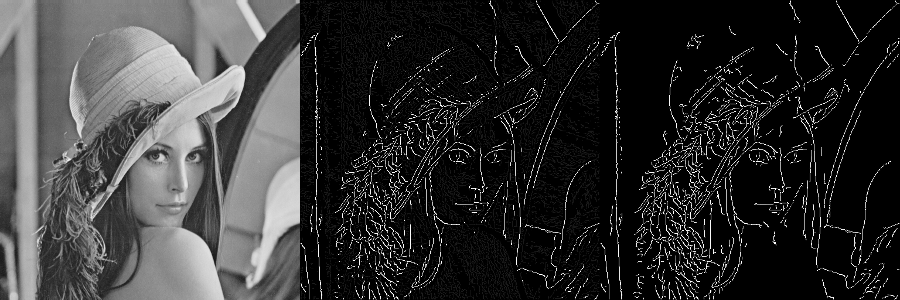

In [ ]:
def hysteresis(img, weak, strong=255):
  imgo = np.copy(img)
  M, N = imgo.shape
  for i in range(1, M-1):
    for j in range(1, N-1):
      if (imgo[i,j] == weak):
        try:
          if ((imgo[i+1, j-1] == strong) or (imgo[i+1, j] == strong) or (imgo[i+1, j+1] == strong)
            or (imgo[i, j-1] == strong) or (imgo[i, j+1] == strong)
            or (imgo[i-1, j-1] == strong) or (imgo[i-1, j] == strong) or (imgo[i-1, j+1] == strong)):
            imgo[i, j] = strong
          else:
            imgo[i, j] = 0
        except IndexError as e:
          pass
  return imgo

img_5 = hysteresis(img_4_res, img_4_weak, img_4_strong)
show_more(300, img_0, img_4_res.astype(np.uint8), img_5.astype(np.uint8))

**Time Comparison with the OpenCV function**

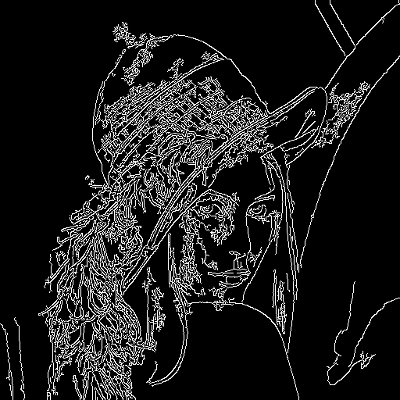

In [ ]:
img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
cvtemp = cv.Canny(img,0,255)
show(cvtemp.astype(np.uint8), 400)


Hand made: 1.1772
OpenCV: 0.0075 >> 156x faster :)


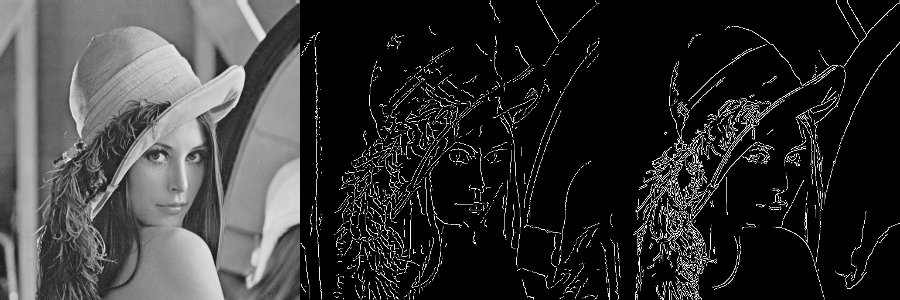

In [ ]:
import time

start = time.time()
temp = cv.GaussianBlur(img_0, ksize=(0, 0), sigmaX=1.4, sigmaY=1.4)
temp, temp_theta = canny_sobel_filters(temp)
temp = canny_non_max_suppression(temp, temp_theta)
temp, temp_weak, temp_strong = canny_threshold(temp)
temp  = hysteresis(temp, temp_weak, temp_strong)
end = time.time()
mytime = time.time() - start
print(f'Hand made: {mytime:.4f}')

start = time.time()
cvtemp = cv.Canny(img_0,100,200)
cvtime = time.time() - start
print(f'OpenCV: {cvtime:.4f} >> {mytime / cvtime:.0f}x faster :)')
show_more(300, img_0, temp.astype(np.uint8), cvtemp.astype(np.uint8))

## Based on 2. derivation

### Marr-Hildreth Edge Detection - Marr filter


1. Input image in grayscale  
2. Convolution with **LoG** (Laplacian of a Gaussian) kernel
   *  $\Delta(G*f) = \Delta G * f$
3. Zero-Crossing (with threshold)
4. Output binary image

The lines (edges) tend to close in on themselves.

**LoG in 1D - graphical representation:**

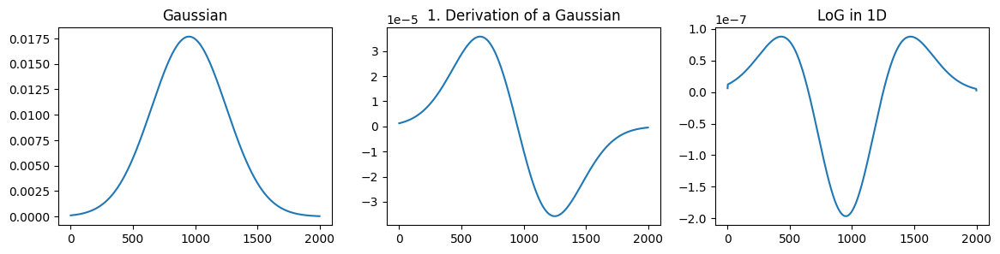

In [ ]:
sigma = 3.0
size = int(2*(np.ceil(3*sigma))+1)
x = np.arange(-size/2, size/2+1, 0.01)
y = (1 / (2*np.pi*sigma**2)) * np.exp(-(x**2) / (2.0*sigma**2))
dy = np.gradient(y)
d2y = np.gradient(dy)

plt.figure(figsize=(14, 3))
plt.subplot(131)
plt.plot(y)
plt.title("Gaussian")
plt.subplot(132)
plt.plot(dy)
plt.title("1. Derivation of a Gaussian")
plt.subplot(133)
plt.plot(d2y)
plt.title("LoG in 1D");

**Analytical derivation LoG in 2D:**

$$
\begin{aligned}
G(x, y; \sigma) = \frac{1}{2\pi\sigma^2}\mathrm{e}^{-\frac{x^2+y^2}{2\sigma^2}}
\end{aligned}
$$
<br />
$$
\begin{aligned}
\mathrm{LoG}(x, y;\sigma) = \Delta_{x,y}G(x,y;\sigma) =
\frac{\partial^2G(x,y;\sigma)}{\partial x^2}+ \frac{\partial^2G(x,y;\sigma)}{\partial y^2}
\end{aligned}
$$
<br />
$$
\begin{aligned}
\frac{\partial G(x,y;\sigma)}{\partial x} =
\frac{1}{2\pi\sigma^2}\mathrm{e}^{-\frac{x^2+y^2}{2\sigma^2}}(-\frac{x}{\sigma^2}) =
-\frac{x}{2\pi\sigma^4}\mathrm{e}^{-\frac{x^2+y^2}{2\sigma^2}}
\end{aligned}
$$
<br />
$$
\begin{aligned}
\frac{\partial^2G(x,y;\sigma)}{\partial x^2} =
-\frac{1}{2\pi\sigma^4}\mathrm{e}^{-\frac{x^2+y^2}{2\sigma^2}} +
\frac{x^2}{2\pi\sigma^6}\mathrm{e}^{-\frac{x^2+y^2}{2\sigma^2}}=
-\frac{1}{2\pi\sigma^4}[1-\frac{x^2}{\sigma^2}]\mathrm{e}^{-\frac{x^2+y^2}{2\sigma^2}}
\end{aligned}
$$
<br />
$$
\begin{aligned}
\frac{\partial^2G(x,y;\sigma)}{\partial y^2} =
-\frac{1}{2\pi\sigma^4}[1-\frac{y^2}{\sigma^2}]\mathrm{e}^{-\frac{x^2+y^2}{2\sigma^2}}
\end{aligned}
$$
<br />
$$
\begin{aligned}
\mathrm{LoG}(x, y;\sigma) =
-\frac{1}{2\pi\sigma^4}[1-\frac{x^2}{\sigma^2}]\mathrm{e}^{-\frac{x^2+y^2}{2\sigma^2}}
-\frac{1}{2\pi\sigma^4}[1-\frac{y^2}{\sigma^2}]\mathrm{e}^{-\frac{x^2+y^2}{2\sigma^2}}=
-\frac{1}{2\pi\sigma^4}[2-\frac{x^2+y^2}{\sigma^2}]\mathrm{e}^{-\frac{x^2+y^2}{2\sigma^2}}=
\frac{1}{\pi\sigma^4}[\frac{x^2+y^2}{2\sigma^2}-1]\mathrm{e}^{-\frac{x^2+y^2}{2\sigma^2}}
\end{aligned}
$$
<br />
$$
\begin{aligned}
G_{norm}(x, y; \sigma) = \frac{1}{2\pi}\mathrm{e}^{-\frac{x^2+y^2}{2\sigma^2}}
\end{aligned}
$$
<br />
$$
\begin{aligned}
\mathrm{LoG}_{norm}(x, y;\sigma) =
\frac{1}{\pi\sigma^2}[\frac{x^2+y^2}{2\sigma^2}-1]\mathrm{e}^{-\frac{x^2+y^2}{2\sigma^2}}
\end{aligned}
$$

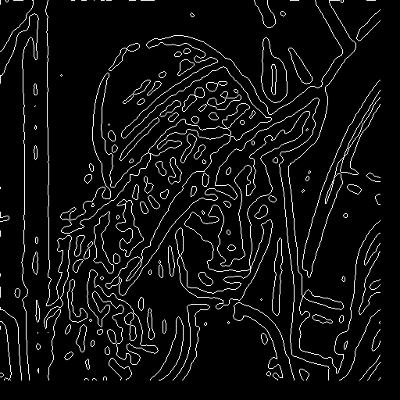

In [ ]:
def marr(img, sigma):
  temp = img.astype(np.float64)
  size = int(2*(np.ceil(3*sigma))+1)
  x, y = np.meshgrid(np.arange(-size/2, size/2+1),
                      np.arange(-size/2, size/2+1))
  kernel = (1 / (np.pi*sigma**2))*((x**2 + y**2)/(2*sigma**2) - 1) * \
            np.exp(-(x**2+y**2) / (2.0*sigma**2))
  # show(kernel*10000,interpolation=cv.INTER_NEAREST)
  kern_size = kernel.shape[0]
  log = cv.filter2D(temp, ddepth=-1, kernel=kernel)
  # computing zero crossing
  zero_crossing = np.zeros_like(log)
  for i in range(log.shape[0]-(kern_size-1)):
    for j in range(log.shape[1]-(kern_size-1)):
      if log[i][j] == 0:
        if (log[i][j-1] < 0 and log[i][j+1] > 0) \
        or (log[i][j-1] < 0 and log[i][j+1] < 0) \
        or (log[i-1][j] < 0 and log[i+1][j] > 0) \
        or (log[i-1][j] > 0 and log[i+1][j] < 0):
          zero_crossing[i][j] = 255
      if log[i][j] < 0:
        if (log[i][j-1] > 0) or (log[i][j+1] > 0) or (log[i-1][j] > 0) or (log[i+1][j] > 0):
          zero_crossing[i][j] = 255
  return zero_crossing.astype(np.uint8)

img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
img_marr = marr(255-img, 4)
show_more(400, img_marr)

#Part 3: Histogram

Histogram is an important tool for graphical representation of data distribution. It is an estimate of the probability distribution of a variable and was first introduced by Karl Pearson. It organizes a group of data points into user-specified ranges. The resulting chart represents the  frequency of values in these ranges.

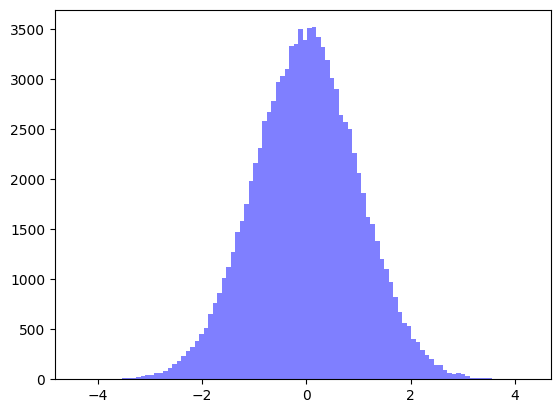

In [ ]:
x = np.random.randn(100000)
num_bins = 100
n, bins, patches = plt.hist(x, num_bins, facecolor='blue', alpha=0.5)
plt.show()

**Image Histogram**
Frequency of brightness levels - lets try on **lena.png** and **drops.pgm**

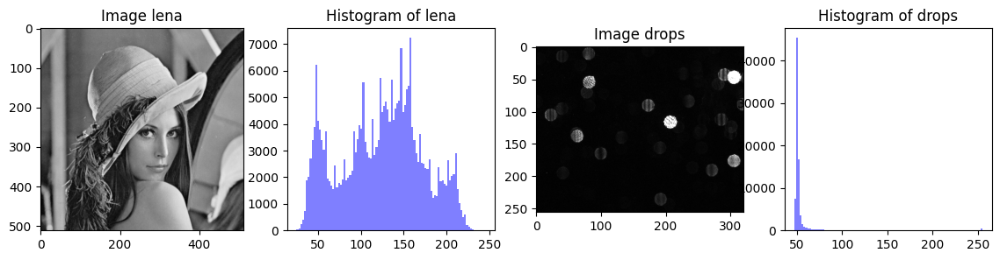

In [ ]:
lena = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
drops = cv.cvtColor(cv.imread('drops.pgm'), cv.COLOR_BGR2GRAY)
num_bins = 100
plt.figure(figsize=(14, 3))
plt.subplot(141)
plt.imshow(lena, "gray")
plt.title("Image lena")
plt.subplot(142)
plt.hist(lena.flatten(), num_bins, facecolor='blue', alpha=0.5)
plt.title("Histogram of lena")
plt.subplot(143)
plt.imshow(drops, "gray")
plt.title("Image drops")
plt.subplot(144)
plt.hist(drops.flatten(), num_bins, facecolor='blue', alpha=0.5)
plt.title("Histogram of drops");

Histogram of RGB Images

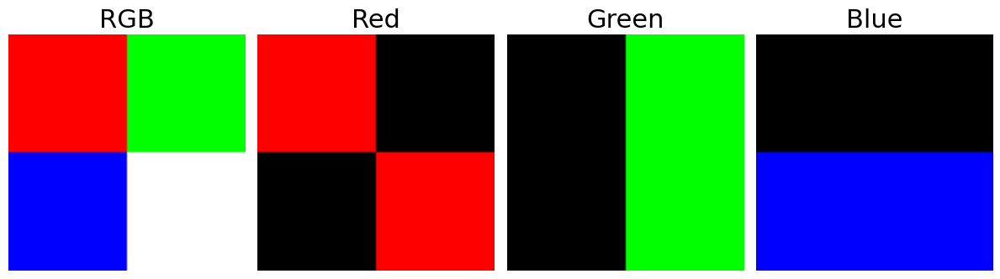

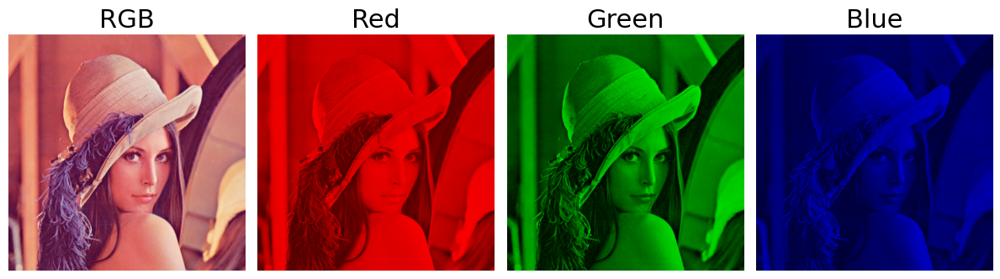

In [ ]:
def show_channels(img):
  _img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
  titles = ['RGB', 'Red', 'Green', 'Blue']
  fig, ax = plt.subplots( 1, 4, figsize=(12,4), sharey = True )
  temp = np.zeros_like(_img)
  ax[0].imshow(_img)
  ax[0].set_title(titles[0], fontsize = 22)
  ax[0].axis('off')
  for i in range(3):
    _temp = np.copy(temp)
    _temp[:,:,i] = _img[:,:,i]
    ax[i+1].imshow(_temp)
    ax[i+1].set_title(titles[i+1], fontsize = 22)
    ax[i+1].axis('off')
  fig.tight_layout()

colors = cv.imread('colors.png')
show_channels(colors)
lena = cv.imread('lena.png')
show_channels(lena)

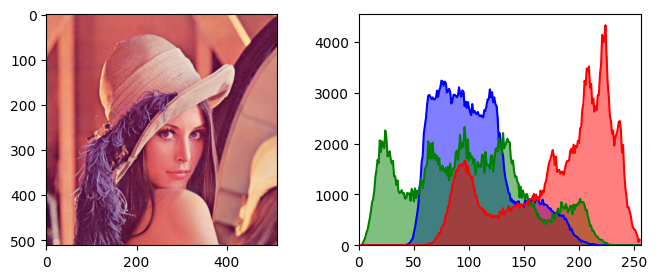

In [ ]:
def show_hist(img):
  plt.figure(figsize=(8, 3))
  plt.subplot(121)
  plt.imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB))
  plt.subplot(122)
  color = ('b','g','r')
  if len(img.shape) == 2:
    histr = cv.calcHist([img],[0],None,[256],[0,256])
    plt.plot(histr, color = 'k')
    plt.hist(img.flatten(),256,[0,256], color = 'k', alpha=0.50)
  elif len(img.shape) == 3:
    for i,col in enumerate(color):
      histr = cv.calcHist([img],[i],None,[256],[0,256])
      plt.plot(histr,color = col)
      plt.hist(img[:,:,i].flatten(),256,[0,256], color = col, alpha=0.50)
  plt.xlim([0,256])
  plt.show()
  return histr

lena = cv.imread('lena.png')
show_hist(lena);

The histogram clearly shows a shift of the red channel to higher values.

**Linear Histogram Expansion**

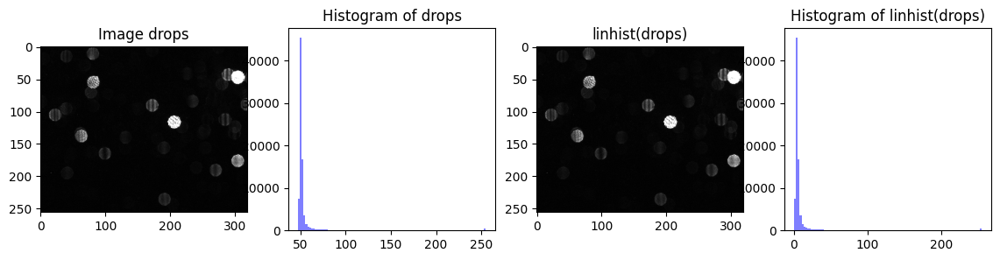

In [ ]:
def linhist(img, newmax=255):
  m = np.min(img)
  M = np.max(img)
  return (img - m) / (M - m) * newmax


drops = cv.cvtColor( cv.imread('drops.pgm'), cv.COLOR_BGR2GRAY )
num_bins = 100

plt.figure(figsize=(14, 3))
plt.subplot(141)
plt.imshow(drops, "gray")
plt.title("Image drops")
plt.subplot(142)
plt.hist(drops.flatten(), num_bins, facecolor='blue', alpha=0.5)
plt.title("Histogram of drops")
plt.subplot(143)
drops2 = linhist(drops)
plt.imshow(drops2, "gray")
plt.title("linhist(drops)")
plt.subplot(144)
n, bins, patches = plt.hist(drops2.flatten(), num_bins, facecolor='blue', alpha=0.5)
plt.title("Histogram of linhist(drops)");

It didn't get much better because of the peak at the end of the range.

We can first move this peak lower and then try again - but this is already a non-linear intervention in the image.

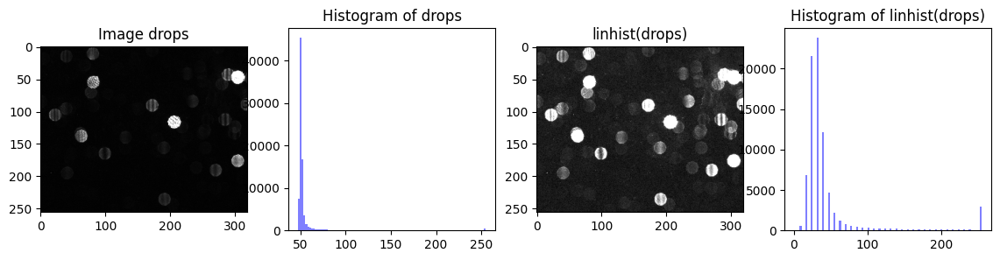

In [ ]:
drops = cv.cvtColor( cv.imread('drops.pgm'), cv.COLOR_BGR2GRAY )
num_bins = 100

plt.figure(figsize=(14, 3))
plt.subplot(141)
plt.imshow(drops, "gray")
plt.title("Image drops")
plt.subplot(142)
plt.hist(drops.flatten(), num_bins, facecolor='blue', alpha=0.5)
plt.title("Histogram of drops")
plt.subplot(143)
drops[drops > 80] = 80
drops2 = linhist(drops)
plt.imshow(drops2, "gray")
plt.title("linhist(drops)")
plt.subplot(144)
n, bins, patches = plt.hist(drops2.flatten(), num_bins, facecolor='blue', alpha=0.5)
plt.title("Histogram of linhist(drops)");

Another non-linear intervention in the image is to increase or decrease the brightness levels and trim the values that are out of range.

But first try to shift the red "channel" in **lena.png** image to the center.

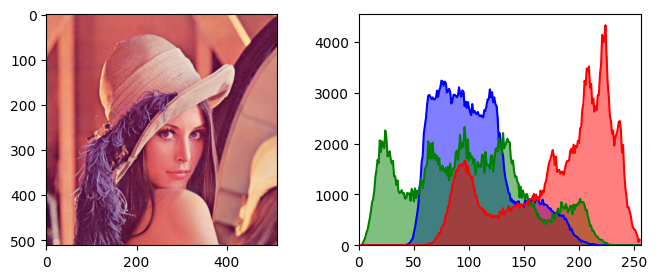

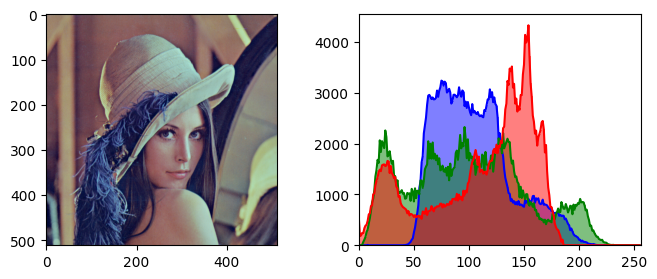

In [ ]:
def colour_channel_shift(img, channel, shift):
  temp = np.copy(img).astype(np.int16)
  _channel = channel - 1
  _temp = temp[:,:,_channel]
  _temp = _temp + shift
  _temp[_temp<0] = 0
  _temp[_temp>255] = 255
  temp[:,:,_channel] = _temp
  return temp.astype(np.uint8)

lena = cv.imread('lena.png')
ch = 0
sh = -70
img = colour_channel_shift(lena, ch, sh)
show_hist(lena)
show_hist(img);

How to do it without these heuristic approaches? >> **Histogram Equalization**

### Histogram equalization

It is the so-called histogram flattening:
* in the continuous case, it's really flattening
* in the descrete case - we move the peaks apart depending on how high they are

* **Histogram $\approx$ the probability density**
* **the cumulative histogram $\approx$ the distribution function**

Let $n_k$ be the number of pixels in the image with level $k\in <0, 255>$ and $p(x_k)=\frac{n_i}{N}$ frequency of occurrence of brightness $k$ in this image, where $N$ its total number of pixels.

Then, the cumulative histogram is:

$$
\begin{aligned}
c_k =
\sum_{i=0}^k p(x_i)
\end{aligned}
$$




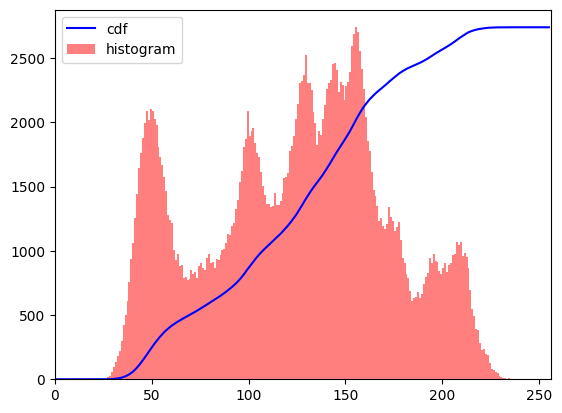

In [ ]:
def show_cumhist(img, color = 'r'):
  hist,bins = np.histogram(img.flatten(),256,[0,256])
  cdf = hist.cumsum()
  cdf_normalized = cdf * float(hist.max()) / cdf.max()
  plt.plot(cdf_normalized, color = 'b')
  plt.hist(img.flatten(),256,[0,256], color = color, alpha=0.5)
  plt.xlim([0,256])
  plt.legend(('cdf','histogram'), loc = 'upper left')

img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)
show_cumhist(img)

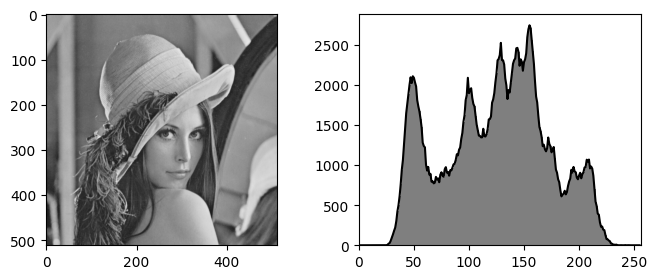

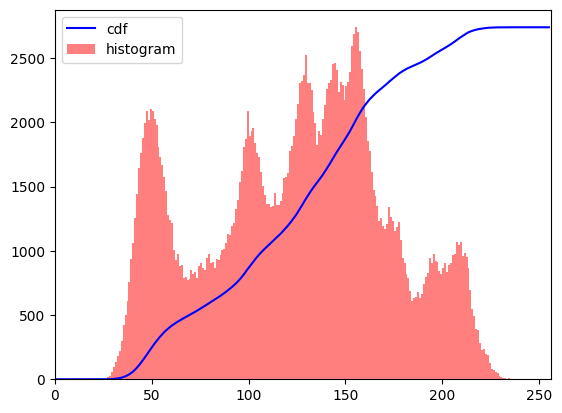

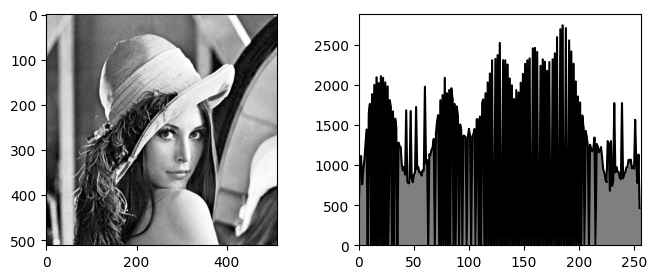

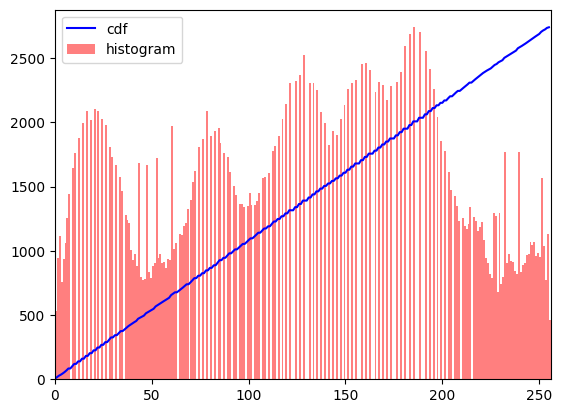

In [ ]:
def equhist(img):
  b = 255 # white colour intensity
  n = img.size # number of all pixels
  temp = np.copy(img) # output image
  s = 0 # number of processed pixels
  for k in range(b+1): # pass pixels through all intensities
    w = img==k # pixels with this intensity 'k'
    p = np.sum(w) # number of these pixels
    temp[w] = np.round((s + p/2) * b / n) # new intensity
    s += p # add these new processed pixels to the all processed
  return temp

lena = cv.cvtColor( cv.imread('lena.png'), cv.COLOR_BGR2GRAY )
img = equhist( lena )
histr_lena = show_hist( lena )
show_cumhist(lena)
histr_img = show_hist( img );
show_cumhist(img)

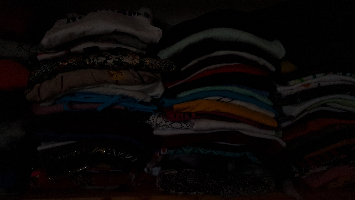

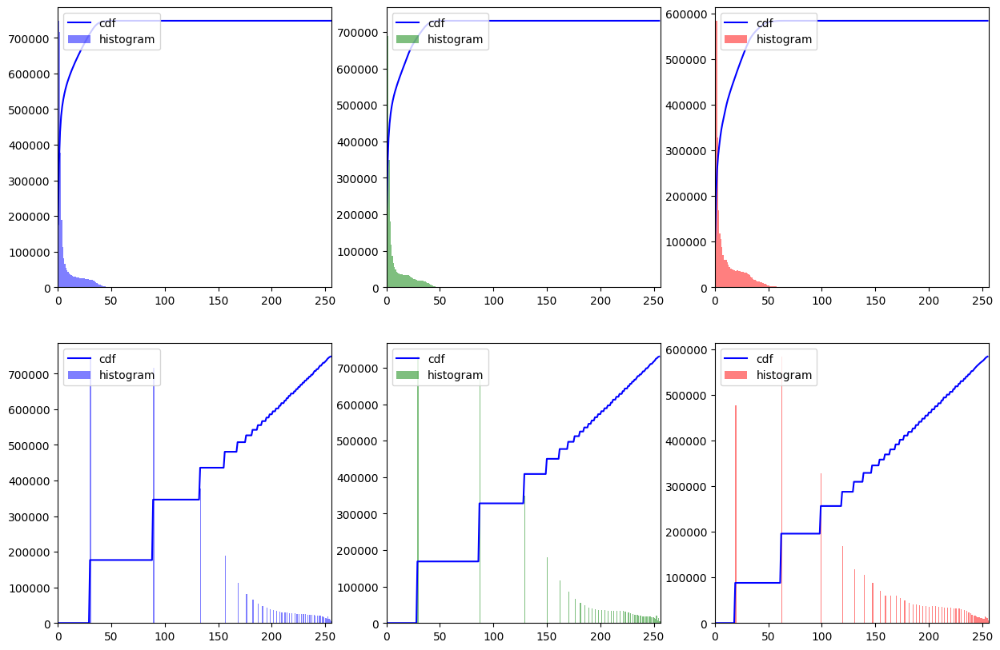

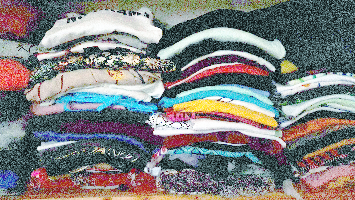

In [ ]:
clothes = cv.imread('clothes.jpg');
show(clothes);
temp = np.copy(clothes)
plt.figure(figsize=(15, 10))
color = ('b','g','r')
for i in range(3):
  idx = 231 + i
  plt.subplot(idx)
  show_cumhist(temp[:,:,i], color=color[i])

for i in range(3):
  temp[:,:,i] = equhist(temp[:,:,i])

for i in range(3):
  idx = 234 + i
  plt.subplot(idx)
  show_cumhist(temp[:,:,i], color=color[i])
plt.show()
cv.fastNlMeansDenoising(temp.astype(np.uint8),
                        h=25,
                        templateWindowSize=10,
                        searchWindowSize=20)
show(temp)

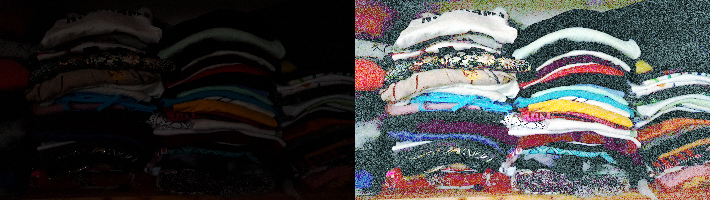

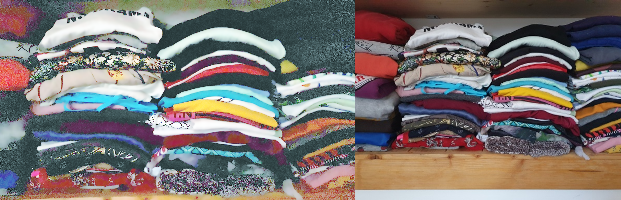

In [ ]:
temp_filtered = cv.fastNlMeansDenoising(temp.astype(np.uint8),
                        h=25,
                        templateWindowSize=10,
                        searchWindowSize=20)
clothes_ref = cv.imread('clothes_ref.jpg');
show_more(200,clothes, temp)
show_more(200,temp_filtered, clothes_ref)

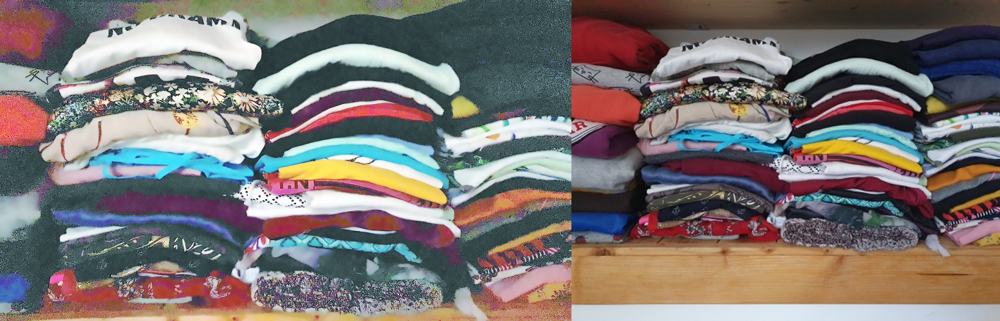

In [ ]:
show_more(500,temp_filtered, clothes_ref)

**Control questions on histogram equalization:**

Let have an image with size 4x4:

1. What happens if the input image is all black?

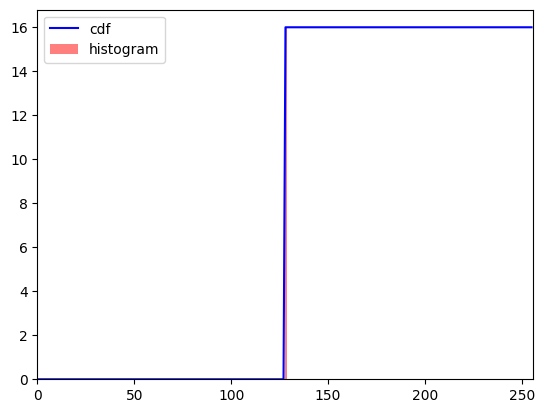

In [ ]:
img = np.zeros((4, 4), dtype=np.uint8)
show_cumhist(equhist(img))

2. What happens if the input image is all black with one white pixel?

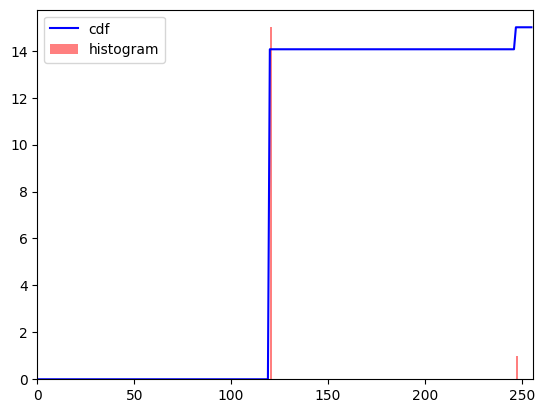

In [ ]:
img = np.zeros((4, 4), dtype=np.uint8)
img[0,0] = 255
show_cumhist(equhist(img))

3. What happens if the input image is half black and half white?

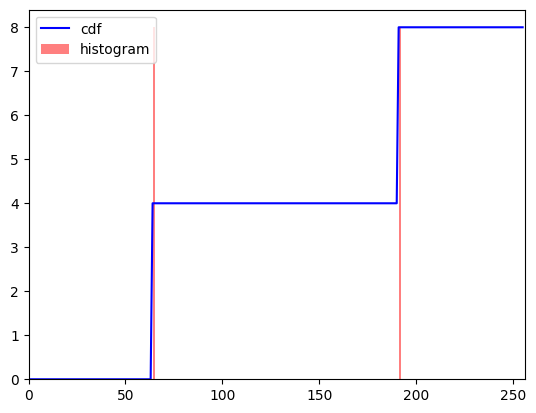

In [ ]:
img = np.zeros((4, 4), dtype=np.uint8)
img[:2,:] = 255
show_cumhist(equhist(img))

#### CLAHE (Contrast Limited Adaptive Histogram Equalization)

Adaptive histogram equalization transform each pixel with a transformation function derived from a neighbourhood region. In its simplest form, each pixel is transformed based on the histogram of a square surrounding the pixel.

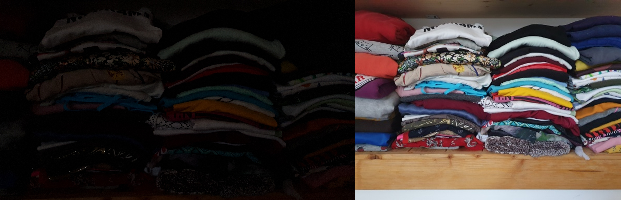

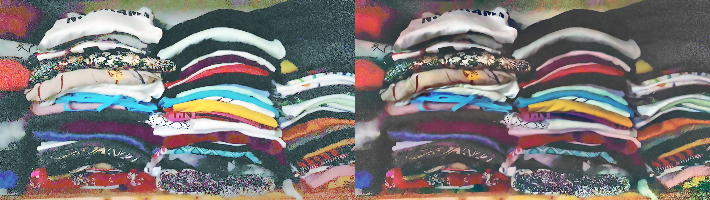

In [ ]:
img = cv.imread('clothes.jpg')
temp = np.copy(img)
clahe = cv.createCLAHE()
for i in range(3):
  temp[:,:,i] = clahe.apply(temp[:,:,i])

show_more(200, img, clothes_ref)

temp_filtered2 = cv.fastNlMeansDenoising(temp.astype(np.uint8),
                        h=25,
                        templateWindowSize=10,
                        searchWindowSize=20)

show_more(200,temp_filtered, temp_filtered2)

Pretty good, huh? It's no wonder that today's mini cameras in cell phones work wonders - but beware - they can add things to the signal that are not actually in the scene.

# Part 4: Homework



## ✍🏼 Homework 002.1 - work with pixels

Write a python script to find the edges in **lena.png** image and color them according to their rotation:

![Ex101.1](https://staff.utia.cas.cz/novozada/dizo/lenaedge.png)

For testing I recommend the **circles.png**:

![Ex101.1](https://staff.utia.cas.cz/novozada/dizo/circles.png)

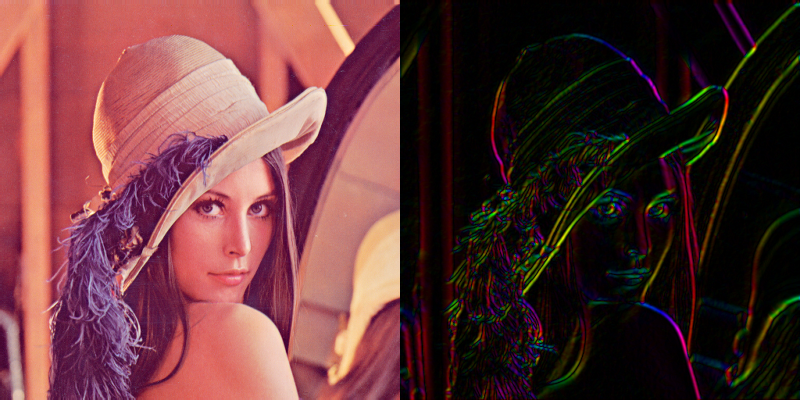

In [204]:
def canny_sobel_filters2(img):
    Ix = cv.Sobel(img, cv.CV_32F, 1, 0, ksize=3)
    Iy = cv.Sobel(img, cv.CV_32F, 0, 1, ksize=3)

    G = np.hypot(Ix, Iy)
    G = G / G.max() * 255
    theta = np.arctan2(Iy, Ix)

    return G, theta

def edges_direction(img):
  if len(img.shape) == 3:
    img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

  img = cv.GaussianBlur(img, ksize=(0, 0), sigmaX=1.4, sigmaY=1.4) # Blur
  edges, theta = canny_sobel_filters2(img) # Sobel
  theta_degrees = (theta * 180 / np.pi) % 180 # Convert radians to degrees on color circle
  saturation = np.full(img.shape[:2], 255, dtype=np.uint8)

  hsv_image = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8) # Create HSV image

  hsv_image[:,:, 0] = theta_degrees.astype(np.uint8) # H channel with edge directions
  hsv_image[:,:, 1] = saturation                     # S channel maximized
  hsv_image[:,:, 2] = edges.astype(np.uint8)         # V channel with "edginess"

  bgr_image = cv.cvtColor(hsv_image, cv.COLOR_HSV2BGR)
  return bgr_image

### visualization ###
img = cv.imread('lena.png')
edges = edges_direction(img)
show_more(400, img, edges)

## ✍🏼 Homework 002.2

Choose 3 arbitrary edge detectors and use them to demonstrate how well they perform when varying the Gaussian noise in the image (SNR). Used the **lena.png** image.

Originals


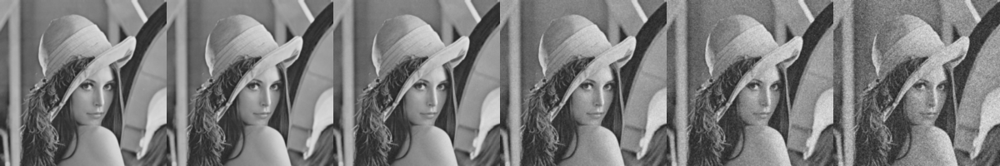

Sobel Edge Detector


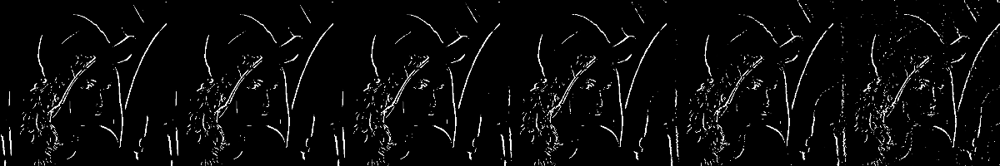

Canny Sobel Edge Detector


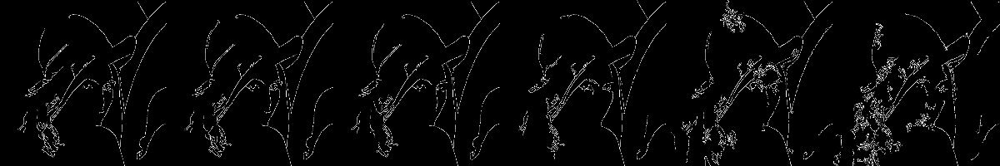

Marr Edge Detector


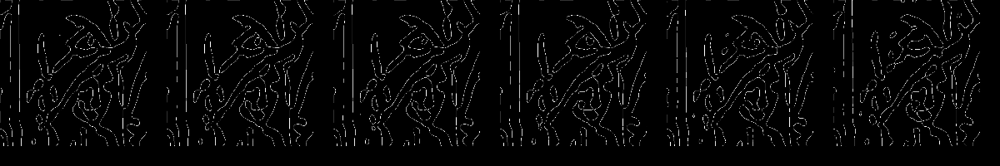

In [223]:
snrs = [100, 50, 20, 10, 5, 1]
originals = []
sobel_results = []
canny_results = []
marr_results = []

img = cv.cvtColor(cv.imread('lena.png'), cv.COLOR_BGR2GRAY)

for snr in snrs:
    noisy = gauss_noise(img, snr).astype(np.uint8)
    noisy = cv.GaussianBlur(noisy, ksize=(0, 0), sigmaX=1.4, sigmaY=1.4)

    originals.append(noisy)
    sobel_results.append(sobel_our(noisy, 100))
    canny_results.append(cv.Canny(noisy, 0, 255))
    marr_results.append(marr(255-noisy, 10))

print("Originals")
show_more(200, *originals)
print("Sobel Edge Detector")
show_more(200, *sobel_results)
print("Canny Sobel Edge Detector")
show_more(200, *canny_results)
print("Marr Edge Detector")
show_more(200, *marr_results)

#
#
#
#
#